# **Cognifyz Internship Exploratory Data Analysis Project - Level 2**

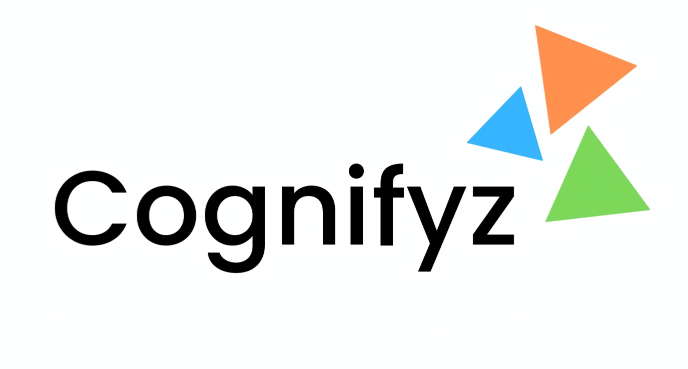

## Acknowledgement

I would like to express my sincere gratitude to **Cognifyz Technologies** for providing me with the opportunity to work on this project as part of my internship.  
This project allowed me to gain valuable hands-on experience in exploratory data analysis and derive meaningful business insights from real-world datasets.  

I am also thankful to my mentors and the team at Cognifyz and AlmaBetter for their guidance and support throughout the project.

# Overview

This project is part of my **Data Analysis internship** at **Cognifyz Technologies**. The objective is to analyze a restaurant dataset using Python to generate meaningful insights and visualizations. The focus is on applying data cleaning, exploration, and statistical methods to better understand patterns within the data.

The analysis is divided into two levels:

* **Level 1** covers foundational tasks such as identifying the top cuisines, analyzing city-wise restaurant distribution and ratings, visualizing price range distributions, and comparing restaurants with and without online delivery.

* **Level 2** expands into intermediate tasks including analyzing restaurant ratings and votes, exploring common cuisine combinations, identifying geographic clusters of restaurants, and evaluating the presence and performance of restaurant chains.

The deliverables include structured Python notebooks and visualizations that highlight insights from the dataset, showcasing practical applications of data analysis techniques.

# Importing Libraries and Setting up Workspace

In [1]:
# importing necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
import os
import warnings

In [2]:
# Setting up workspace

%matplotlib inline
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',500)

In [3]:
# Loading Dataset

df = pd.read_csv("/content/drive/MyDrive/Cognifyz Internship/Dataset .csv")

# Initial Exploration

In [4]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


## First 5 rows

In [5]:
# Viewing the top 5 rows
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


## Bottom 5 rows

In [6]:
# Viewing the bottom 5 rows
df.tail()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901
9550,5927402,Walter's Coffee Roastery,208,��stanbul,"Cafea��a Mahallesi, Bademalt۱ Sokak, No 21/B, ...",Moda,"Moda, ��stanbul",29.026016,40.984776,Cafe,55,Turkish Lira(TL),No,No,No,No,2,4.0,Green,Very Good,591


## Number of Rows and Columns

In [7]:
print(f"The data set has:\n1.) {df.shape[0]} rows, and\n2.) {df.shape[1]} columns")

The data set has:
1.) 9551 rows, and
2.) 21 columns


## Dataset information

In [8]:
# Checking on the info and datatypes of the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

## Duplicates

In [9]:
# Checking the number of true duplicates
print(f"Number of true duplicate entries: {df.duplicated().sum()}")

Number of true duplicate entries: 0


## Nulls

### Number of Nulls

In [10]:
# Checking the number of null values
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


### Percentage of Nulls

In [11]:
# Checking the percentage of null values
df.isnull().mean()*100

,0
Restaurant ID,0.000000
Restaurant Name,0.000000
Country Code,0.000000
City,0.000000
Address,0.000000
Locality,0.000000
Locality Verbose,0.000000
Longitude,0.000000
Latitude,0.000000
Cuisines,0.094231


## Dataset Numerical Data Description

In [12]:
# Checking the numerical data
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


## Dataset Categorical Data Description

In [13]:
# Checking the categorical data
df.describe(include='object')

,Restaurant Name,City,Address,Locality,Locality Verbose,Cuisines,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Rating color,Rating text
count,9551,9551,9551,9551,9551,9542,9551,9551,9551,9551,9551,9551,9551
unique,7446,141,8918,1208,1265,1825,12,2,2,2,1,6,6
top,Cafe Coffee Day,New Delhi,"Dilli Haat, INA, New Delhi",Connaught Place,"Connaught Place, New Delhi",North Indian,Indian Rupees(Rs.),No,No,No,No,Orange,Average
freq,83,5473,11,122,122,936,8652,8393,7100,9517,9551,3737,3737


# Initial Exploration Revealed the Following



*   Dataset loaded successfully
*   The dataset seems to contain information about restaurants in different parts of the world offering different cuisines
*   There are 9551 rows and 21 columns
*   Cuisines column has 9 Null values and apart from that no other column has Null Values. This can easily be filled with some research
*   There are no true duplicates in the dataset. However, there seem to be restaurants with the same name but different values, probably restaurant chains or franchises.
*   There seem to be columns such as Aggregate rating, Votes and Average Cost for Two where the values are zero.



# Initial Cleaning and Transformation of Data

## Handling Nulls

In [14]:
# Checking the restaurant names and location information of restaurants that have null cuisines
df[df['Cuisines'].isnull()][['Restaurant Name','City','Address','Cuisines']]

,Restaurant Name,City,Address,Cuisines
84,Cookie Shoppe,Albany,"115 N Jackson St, Albany, GA 31701",NaN
87,Pearly's Famous Country Cookng,Albany,"814 N Slappey Blvd, Albany, GA 31701",NaN
94,Jimmie's Hot Dogs,Albany,"204 S Jackson St, Albany, GA 31701",NaN
297,Corkscrew Cafe,Gainesville,"51 W Main St, Dahlonega, GA 30533",NaN
328,Dovetail,Macon,"543 Cherry St, Macon, GA 31201",NaN
346,HI Lite Bar & Lounge,Miller,"109 N Broadway Ave, Miller, SD 57362",NaN
368,Hillstone,Orlando,"215 South Orlando Avenue, Winter Park, FL 32789",NaN
418,Leonard's Bakery,Rest of Hawaii,"933 Kapahulu Ave, Honolulu, HI 96816",NaN
455,Tybee Island Social Club,Savannah,"1311 Butler Ave, Tybee Island, GA 31328",NaN


In [15]:
null_restaurant_cuisines=df[df['Cuisines'].isnull()]['Restaurant Name'].tolist() # List containing names of the restaurants

# Upon research, the restaurants mentioned above were found to have the following Cuisines respectively
null_cuisines=['American, Cafe','American','American, Fast Food','American','American','American, Bar','American','American, Fast food, Portuguese, Hawaiian','American, Mexican']

# Assigning the above values to the respective restaurants
for i in range(0,9):
  mask = (df['Cuisines'].isnull()) & (df['Restaurant Name']==null_restaurant_cuisines[i])
  df.loc[mask, 'Cuisines'] = null_cuisines[i]

In [16]:
# Making sure there are no more nulls
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,0


## Standardising Column Names

In [17]:
# Standardising column names for easier readability and reference

df.columns = ['Restaurant_ID', 'Restaurant_Name', 'Country_Code', 'City', 'Address', 'Locality', 'Locality_Verbose',
              'Longitude', 'Latitude', 'Cuisines', 'Average_Cost_For_Two', 'Currency', 'Has_Table_Booking',
              'Has_Online_Delivery', 'Is_Delivering_Now', 'Switch_To_Order_Menu', 'Price_Range', 'Aggregate_Rating',
              'Rating_Color', 'Rating_Text', 'Votes']

## Fixing Country and Currency Values

In [18]:
# Checking redundancy between country and currency

print(f"# of Currency values - {df['Currency'].nunique()}")
print(f"# of Country Code values - {df['Country_Code'].nunique()}")

# of Currency values - 12
# of Country Code values - 15


**There seem to be countries with the same currency**

In [19]:
# Creating a country map for easy readability
country_map = {162: "Philippines",30: "Brazil",216: "United States",14: "Australia",37: "Canada",
               184: "Singapore",214: "UAE",1: "India",94: "Indonesia",148: "New Zealand",
               215: "England",166: "Qatar",189: "South Africa",191: "Sri Lanka",208: "Turkey"}

# Creating a new Country column for easy readability
df['Country'] = df['Country_Code'].map(country_map)

# Checking any mistakes in country-currency relationship
for i in df['Country'].unique().tolist():
  print(f"{i} -> {df[df['Country']==i]['Currency'].unique()}")

Philippines -> ['Botswana Pula(P)']
Brazil -> ['Brazilian Real(R$)']
United States -> ['Dollar($)']
Australia -> ['Dollar($)']
Canada -> ['Dollar($)']
Singapore -> ['Dollar($)']
UAE -> ['Emirati Diram(AED)']
India -> ['Indian Rupees(Rs.)']
Indonesia -> ['Indonesian Rupiah(IDR)']
New Zealand -> ['NewZealand($)']
England -> ['Pounds(��)']
Qatar -> ['Qatari Rial(QR)']
South Africa -> ['Rand(R)']
Sri Lanka -> ['Sri Lankan Rupee(LKR)']
Turkey -> ['Turkish Lira(TL)']


**Some countries seem to share the same currency name but have different values and some countries seem to have the wrong currency assigned to them**

In [20]:
# Creating a currency map to fix redundancy and incorrectness

currency_map = {
    'Philippines':     'Philippine Peso (PHP, ₱)',
    'Botswana':        'Botswana Pula (BWP, P)',
    'Brazil':          'Brazilian Real (BRL, R$)',
    'United States':   'US Dollar (USD, $)',
    'Australia':       'Australian Dollar (AUD, A$)',
    'Canada':          'Canadian Dollar (CAD, C$)',
    'Singapore':       'Singapore Dollar (SGD, S$)',
    'UAE':             'United Arab Emirates Dirham (AED)',
    'India':           'Indian Rupee (INR, ₹)',
    'Indonesia':       'Indonesian Rupiah (IDR, Rp)',
    'New Zealand':     'New Zealand Dollar (NZD, NZ$)',
    'England':         'British Pound Sterling (GBP, £)',
    'Qatar':           'Qatari Riyal (QAR, QR)',
    'South Africa':    'South African Rand (ZAR, R)',
    'Sri Lanka':       'Sri Lankan Rupee (LKR)',
    'Turkey':          'Turkish Lira (TRY, ₺)'
}

# Mapping the correct currency to the respected column
df['Currency'] = df['Country'].map(currency_map)

# Making sure the correction has taken effect
for i in df['Country'].unique().tolist():
  print(f"{i} -> {df[df['Country']==i]['Currency'].unique()}")

Philippines -> ['Philippine Peso (PHP, ₱)']
Brazil -> ['Brazilian Real (BRL, R$)']
United States -> ['US Dollar (USD, $)']
Australia -> ['Australian Dollar (AUD, A$)']
Canada -> ['Canadian Dollar (CAD, C$)']
Singapore -> ['Singapore Dollar (SGD, S$)']
UAE -> ['United Arab Emirates Dirham (AED)']
India -> ['Indian Rupee (INR, ₹)']
Indonesia -> ['Indonesian Rupiah (IDR, Rp)']
New Zealand -> ['New Zealand Dollar (NZD, NZ$)']
England -> ['British Pound Sterling (GBP, £)']
Qatar -> ['Qatari Riyal (QAR, QR)']
South Africa -> ['South African Rand (ZAR, R)']
Sri Lanka -> ['Sri Lankan Rupee (LKR)']
Turkey -> ['Turkish Lira (TRY, ₺)']


## Normalizing Average Cost for Two to USD for easy comparison later on if needed

In [21]:
# Creating a dictionary to help map correct conversion rate to the respective column

conversion_to_usd = {
    'Philippine Peso (PHP, ₱)': 0.01818,
    'Botswana Pula (BWP, P)': 0.0749,
    'Brazilian Real (BRL, R$)': 0.1845,
    'US Dollar (USD, $)': 1.0,
    'Australian Dollar (AUD, A$)': 0.6612,
    'Canadian Dollar (CAD, C$)': 0.7242,
    'Singapore Dollar (SGD, S$)': 0.7806,
    'Indian Rupee (INR, ₹)': 0.01134,
    'Indonesian Rupiah (IDR, Rp)': 0.0000609,
    'New Zealand Dollar (NZD, NZ$)': 0.6944,
    'British Pound Sterling (GBP, £)': 1.3567,
    'Qatari Riyal (QAR, QR)': 0.2747,
    'United Arab Emirates Dirham (AED)': 0.2723,
    'South African Rand (ZAR, R)': 0.1432,
    'Sri Lankan Rupee (LKR)': 0.01336,
    'Turkish Lira (TRY, ₺)': 0.2364
}

# Creating a new column and mapping the conversion rates to the respective currencies
df['Conversion_Rate_To_USD'] = df['Currency'].map(conversion_to_usd)

# Creating a new column that translates the Average Cost for Two to one single currency across the dataset
df['Equivalent_In_USD'] = df['Average_Cost_For_Two'] * df['Conversion_Rate_To_USD']

## Dropping Columns that currently seem to be irrelevant for the analysis tasks required

In [22]:
# Keeping the following columns as they are relevant to the analysis
df = df[['Restaurant_ID','Restaurant_Name','Country_Code','Country','City',
         'Longitude','Latitude','Cuisines','Average_Cost_For_Two','Currency',
         'Equivalent_In_USD','Has_Table_Booking','Has_Online_Delivery',
         'Price_Range','Aggregate_Rating','Rating_Color','Rating_Text','Votes']]

## Creating a New Column to be used for weighted rating later

In [23]:
df['WR_Numerator'] = df['Aggregate_Rating']*df['Votes']

# Data Dictionary

| Column Name            | Description                                                                 | Data Type   | Example / Range                                      |
|-------------------------|-----------------------------------------------------------------------------|-------------|------------------------------------------------------|
| **Restaurant_ID**       | Unique identifier for each restaurant.                                     | Integer     | 1, 2345, 67890                                       |
| **Restaurant_Name**     | Name of the restaurant.                                                    | String      | "Domino's Pizza", "Biryani House"                    |
| **Country_Code**        | Numerical code representing the country where the restaurant is located.   | Integer     | 1 (India), 215 (USA)                                |
| **Country**             | Name of the country (mapped from `Country_Code`).                          | String      | "India", "United States"                             |
| **City**                | City where the restaurant is located.                                      | String      | "Mumbai", "New Delhi", "New York"                    |
| **Longitude**           | Longitude coordinate of the restaurant’s location.                         | Float       | -74.0059, 72.8777                                    |
| **Latitude**            | Latitude coordinate of the restaurant’s location.                          | Float       | 40.7128, 19.0760                                     |
| **Cuisines**            | Type(s) of cuisines served by the restaurant (may include multiple).       | String      | "North Indian", "Chinese, Fast Food"                 |
| **Average_Cost_For_Two**| Average cost for two people dining at the restaurant, in local currency.   | Integer     | 200, 500, 1200                                       |
| **Currency**            | Currency in which the restaurant’s costs are listed.                       | String      | "INR", "Dollar($)", "Brazilian Real(R$)"             |
| **Equivalent_In_USD**   | Average cost for two converted into US Dollars (normalized).                | Float       | 2.5, 15.0, 50.0                                      |
| **Has_Table_Booking**   | Indicates if the restaurant provides table booking.                        | Categorical | "Yes" / "No"                                         |
| **Has_Online_Delivery** | Indicates if the restaurant offers online delivery.                        | Categorical | "Yes" / "No"                                         |
| **Price_Range**         | Price category of the restaurant.                                          | Integer     | 1 (cheapest), 2, 3, 4 (most expensive)               |
| **Aggregate_Rating**    | Average customer rating of the restaurant.                                 | Float       | 0.0 – 5.0                                            |
| **Rating_Color**        | Color code associated with the restaurant’s rating.                        | String      | "Green", "Orange", "Red"                             |
| **Rating_Text**         | Textual description of the rating.                                         | String      | "Excellent", "Good", "Average", "Poor"               |
| **Votes**               | Number of votes received for the restaurant’s rating.                      | Integer     | 0, 15, 250, 5000                                     |
| **WR_Numerator** | Weighted Rating numerator, calculated as `Aggregate_Rating * Votes`. | Float     | 0.0, 125.5, 2400.0 |

# Tasks

## Level 2 - Task 1

Task: Restaurant Ratings
* Analyze the distribution of aggregate ratings and determine the most common rating range.
* Calculate the average number of votes received by restaurants.


### Analyze the distribution of aggregate ratings and determine the most common rating range.

#### Analysis of distribution of aggregate ratings

In [24]:
# Creating a new dataset without considering no ratings and minimum votes as 30 as per CLT
df_rated = df[(df['Rating_Text']!='Not rated')&(df['Votes']>30)]

# Grouping by rating color as it is bounded by a rating range
df_rated = df_rated.groupby('Rating_Color').agg({'WR_Numerator':'sum','Votes':'sum'}).reset_index()

# Creating a new column weighted rating
df_rated['Weighted_Rating']=round(df_rated['WR_Numerator']/df_rated['Votes'],1)

# Creating a new column rating range that specifies the color and range
df_rated['Rating_Range'] = df_rated['Rating_Color'] + " [" + df[(df['Rating_Text']!='Not rated')&(df['Votes']>30)].groupby('Rating_Color')['Aggregate_Rating'].min().reset_index()['Aggregate_Rating'].astype(str) + " - " + df[(df['Rating_Text']!='Not rated')&(df['Votes']>30)].groupby('Rating_Color')['Aggregate_Rating'].max().reset_index()['Aggregate_Rating'].astype(str) + "]"

# Taking only necessary columns
df_rated = df_rated[['Rating_Range','Votes','Weighted_Rating']].sort_values(by='Votes',ascending=False)

#visualizing the created dataframe
df_rated

,Rating_Range,Votes,Weighted_Rating
1,Green [4.0 - 4.4],561084,4.2
4,Yellow [3.5 - 3.9],476565,3.7
0,Dark Green [4.5 - 4.9],256131,4.7
2,Orange [2.5 - 3.4],150065,3.1
3,Red [1.8 - 2.4],16126,2.3


#### Plot

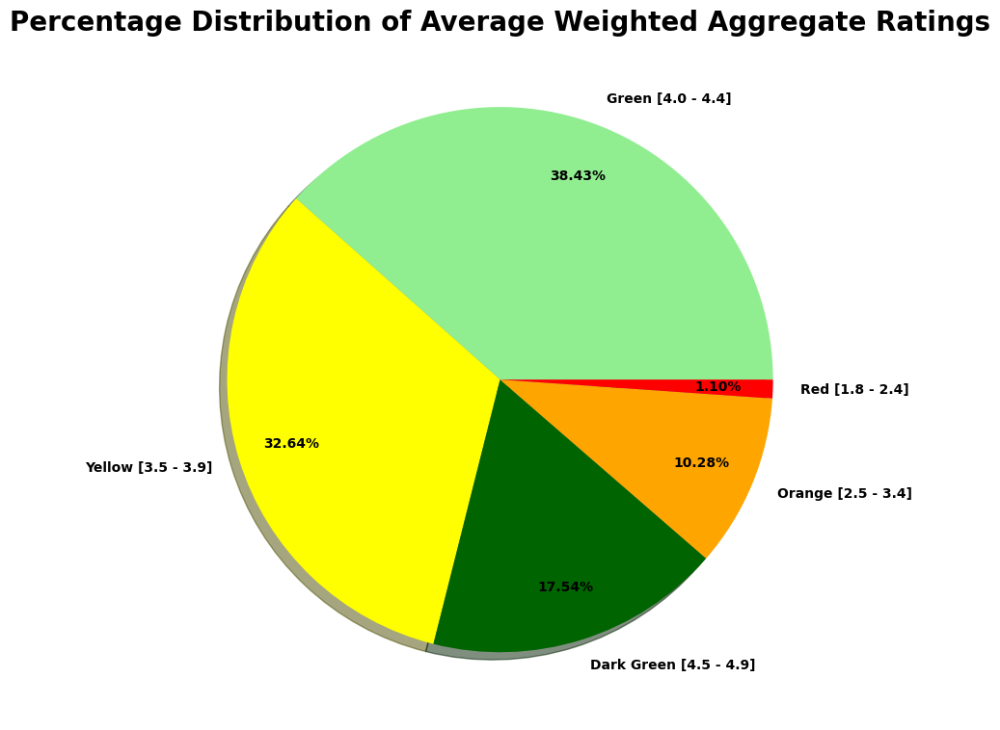

In [25]:
# Creating a piechart to show the percentage distribution
plt.figure(figsize=(10.24,7.68))
plt.pie(x=df_rated['Votes'],labels=df_rated['Rating_Range'],colors=['lightgreen','yellow','darkgreen','orange','red'],autopct='%1.2f%%',shadow=True,textprops={'fontweight':'semibold'},labeldistance=1.1,pctdistance=0.8)
plt.title('Percentage Distribution of Average Weighted Aggregate Ratings',fontdict={'fontsize':20,'fontweight':'bold'})
plt.tight_layout()
plt.show()

### Calculate the average number of votes received by restaurants.

In [26]:
print(f"Average number of votes across the dataset = {round(df[(df['Rating_Text']!='Not rated')&(df['Votes']>0)]['Votes'].mean())}")

Average number of votes across the dataset = 202


Average number of votes across the dataset = **202**

## Level 2 - Task 2

Task: Cuisine Combination
* Identify the most common combinations of cuisines in the dataset.
* Determine if certain cuisine combinations tend to have higher ratings.


### Identify the most common combinations of cuisines in the dataset.

In [27]:
# Making sure only rows with string values are selected
df_cuisines = df[df['Cuisines'].apply(lambda x: isinstance(x,str))]

# Converting it to set to avoid duplicates
df_cuisines['Cuisines'] = df_cuisines['Cuisines'].apply(lambda x: set(x.split(", ")))

# Selecting sets with more than 1 value to keep only combinations
df_cuisines = df_cuisines[df_cuisines['Cuisines'].apply(lambda x: len(x)>1)]

# Converting it back to a sorted string as sets are unhashable
df_cuisines['Cuisines'] = df_cuisines['Cuisines'].apply(lambda x: ', '.join(sorted(list(x))))

# Doing the 1st round of grouping to establish limits
# Keeping only restaurants with more than 30 votes
# Keeping only restaurants that have been rated
df_cuisines_temp=df_cuisines[(df_cuisines['Rating_Text']!='Not rated')&(df_cuisines['Votes']>30)].groupby(['Restaurant_Name','Cuisines']).agg({'Restaurant_Name':'count','Cuisines':'count','Aggregate_Rating':['min','max'],'Votes':'sum','WR_Numerator':'sum'}).reset_index()

# Assigning new names to the columns
df_cuisines_temp.columns = ['Restaurant_Name','Cuisines','Restaurant_Count','Cuisines_Count','Lower_Bound','Upper_Bound','Total_Votes','WR_Numerator']

# Making sure no redundancies are present
df_cuisines_temp=df_cuisines_temp[df_cuisines_temp['Restaurant_Count']==df_cuisines_temp['Cuisines_Count']].sort_values(by='Restaurant_Count',ascending=False).reset_index()

# Creating the column for weighted vote numerator
df_cuisines_temp['WV_Numerator'] = df_cuisines_temp['Total_Votes']*df_cuisines_temp['Restaurant_Count']

# Finally grouping by Cuisines to see commonness and popularity
df_cuisines_temp2=df_cuisines_temp.groupby('Cuisines').agg({'Cuisines_Count':'sum','Total_Votes':'sum','WV_Numerator':'sum'}).reset_index().sort_values(by='Cuisines_Count',ascending=False)

# Calculating the weighted common column
df_cuisines_temp2['Weighted_Common'] = round(df_cuisines_temp2['WV_Numerator']/df_cuisines_temp2['Total_Votes'])

# Displaying the top 10 common cuisines based on occurance frequency
df_common_cuisines=df_cuisines_temp2.sort_values(by='Cuisines_Count',ascending=False).reset_index().head(10)
df_common_cuisines

,index,Cuisines,Cuisines_Count,Total_Votes,WV_Numerator,Weighted_Common
0,702,"Chinese, North Indian",236,46815,156990,3.0
1,1000,"Mughlai, North Indian",226,67492,248752,4.0
2,697,"Chinese, Mughlai, North Indian",178,33395,40678,1.0
3,861,"Fast Food, Pizza",78,9589,399479,42.0
4,451,"Burger, Fast Food",76,15006,255467,17.0
5,705,"Chinese, North Indian, South Indian",64,9280,58981,6.0
6,612,"Chinese, Continental, North Indian",60,11978,13632,1.0
7,318,"Bakery, Desserts",56,7978,10867,1.0
8,101,"American, Fast Food, Healthy Food, Salad",54,5972,322488,54.0
9,323,"Bakery, Fast Food",50,6107,11131,2.0


In [28]:
# displaying the top 10 popular cuisines based on votes
df_popular_cuisines=df_cuisines_temp2.sort_values(by='Weighted_Common',ascending=False).reset_index().head(10)
df_popular_cuisines

,index,Cuisines,Cuisines_Count,Total_Votes,WV_Numerator,Weighted_Common
0,101,"American, Fast Food, Healthy Food, Salad",54,5972,322488,54.0
1,861,"Fast Food, Pizza",78,9589,399479,42.0
2,448,"Burger, Desserts, Fast Food",18,5945,107010,18.0
3,451,"Burger, Fast Food",76,15006,255467,17.0
4,852,"Fast Food, Italian, Pizza",35,4593,68897,15.0
5,560,"Cafe, Tea",17,2572,36844,14.0
6,624,"Chinese, Desserts, Fast Food, Mithai, North In...",15,3395,36438,11.0
7,858,"Fast Food, North Indian, Raw Meats",12,615,4854,8.0
8,362,"Beverages, Chinese, Desserts, Fast Food, Mitha...",7,1586,11102,7.0
9,325,"Bakery, Italian, Pizza",8,1496,9758,7.0


#### Plot 1

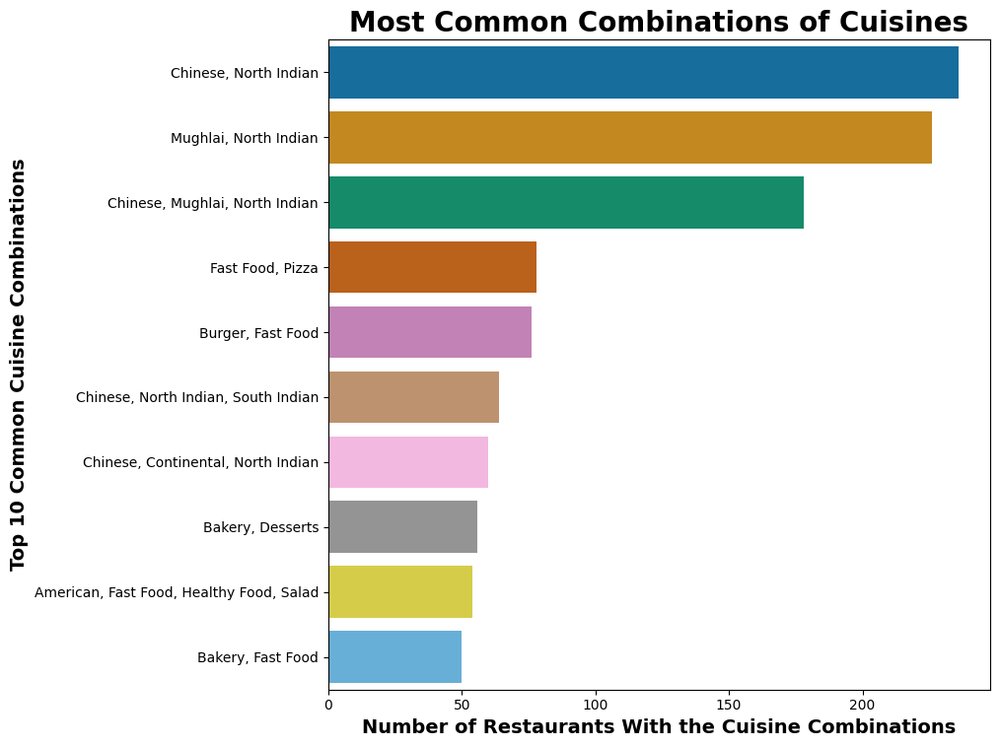

In [29]:
# Plot for common combination of cuisines
plt.figure(figsize=(10.24,7.68))
sns.barplot(data=df_cuisines_temp2.sort_values(by='Cuisines_Count',ascending=False).reset_index().head(10),x='Cuisines_Count',y='Cuisines',hue='Cuisines',palette='colorblind')
plt.ylabel('Top 10 Common Cuisine Combinations',fontdict={'fontsize':14,'fontweight':'bold'})
plt.xlabel('Number of Restaurants With the Cuisine Combinations',fontdict={'fontsize':14,'fontweight':'bold'})
plt.title('Most Common Combinations of Cuisines',fontdict={'fontsize':20,'fontweight':'bold'})

plt.tight_layout()
plt.show()

#### Plot - 2

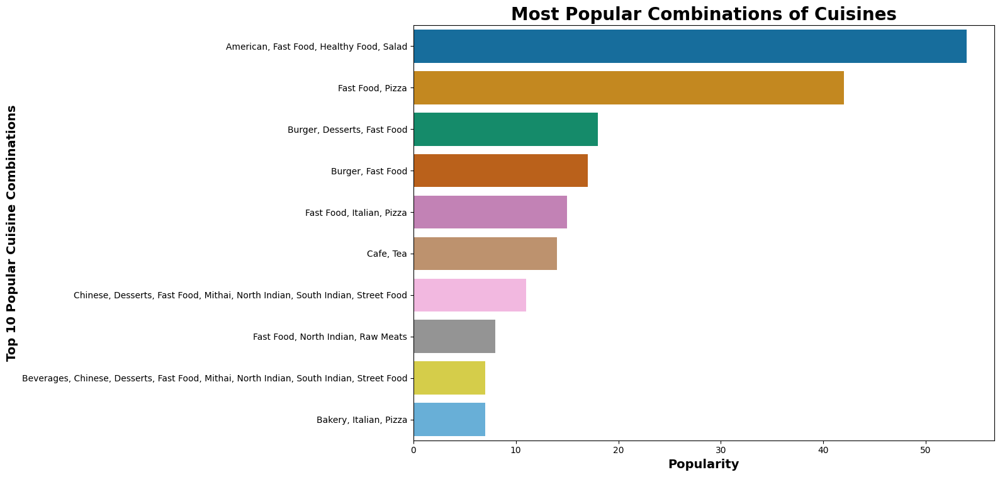

In [30]:
# Plot for popular combination of cuisines
plt.figure(figsize=(16,7.68))
sns.barplot(data=df_cuisines_temp2.sort_values(by='Weighted_Common',ascending=False).reset_index().head(10),x='Weighted_Common',y='Cuisines',hue='Cuisines',palette='colorblind')
plt.ylabel('Top 10 Popular Cuisine Combinations',fontdict={'fontsize':14,'fontweight':'bold'})
plt.xlabel('Popularity',fontdict={'fontsize':14,'fontweight':'bold'})
plt.title('Most Popular Combinations of Cuisines',fontdict={'fontsize':20,'fontweight':'bold'})

plt.tight_layout()
plt.show()

### Determine if certain cuisine combinations tend to have higher ratings.

In [31]:
# Grouping by cuisines and checking the numerical description of some columns
df_cuisine_rating=df_cuisines_temp.groupby('Cuisines').agg({'Lower_Bound':'min','Upper_Bound':'max','Total_Votes':'sum','WR_Numerator':'sum'}).reset_index()

# Calculating the weighted rating for the above grouping
df_cuisine_rating['Weighted_Rating'] = round(df_cuisine_rating['WR_Numerator']/df_cuisine_rating['Total_Votes'],1)

# Sorting the values by Weighted Rating
df_cuisine_rating = df_cuisine_rating.sort_values(by='Weighted_Rating',ascending=False)

# Only keeping entries with weighted rating above average
df_cuisine_top_rating=df_cuisine_rating[df_cuisine_rating['Weighted_Rating']>=3.5]

# creating a list to hold top rated cuisines
top_rated_cuisines=df_cuisine_top_rating['Cuisines'].tolist()

# Creating a new dataframe for final checking
# Keeping only cuisines that are top_rated
# Not considering cuisines that were not rated
# Not considering entries that have fewer than 30 vores
df_temp=df_cuisines[(df_cuisines['Cuisines'].apply(lambda x: x in top_rated_cuisines))&(df_cuisines['Rating_Text']!='Not rated')&(df_cuisines['Votes']>30)].groupby('Cuisines').agg({'Restaurant_Name':'count','Votes':['max','min','sum'],'Aggregate_Rating':['max','min','mean'],'WR_Numerator':'sum'}).reset_index()

# Renaming columns for ease of readability
df_temp.columns = ['Cuisines','Restaurant_Count','Max_Votes','Min_Votes','Total_Votes','Max_Rating','Min_Rating','Avg_Rating','WR_Numerator']

# Keeping only cuisines that are present in more than one restaurant
df_temp=df_temp[df_temp['Restaurant_Count']>1].sort_values(by='Restaurant_Count',ascending=False)

# Calculating the weighted average rating
df_temp['Weighted_Rating'] = round(df_temp['WR_Numerator']/df_temp['Total_Votes'],1)

# Considering a threshold of 10 restaurants
# A cuisine must be present in more than 10 restaurants to have its ratings validated
df_temp=df_temp[df_temp['Restaurant_Count']>10].sort_values(by='Weighted_Rating',ascending=False)

# Keeping only necessary columns
df_temp = df_temp[['Cuisines','Restaurant_Count','Total_Votes','Weighted_Rating']]

# Considering top rating to be more than 4
# More than 4 is green and dark green
# Signifies positive rating
df_temp=df_temp[df_temp['Weighted_Rating']>=4]

df_temp

,Cuisines,Restaurant_Count,Total_Votes,Weighted_Rating
852,"Japanese, Sushi",18,5705,4.3
39,"American, Burger",14,6729,4.3
473,"Cafe, Continental, Italian",18,8354,4.2
704,"Continental, North Indian",28,19058,4.2
297,"Bakery, Desserts",56,7978,4.1
172,"Asian, Chinese",12,3677,4.1
298,"Bakery, Desserts, Fast Food",44,12546,4.0


The following cuisine combinations have a higher rating

* Japanese, Sushi
* American, Burger
* Cafe, Continental, Italian
* Continental, North Indian
* Bakery, Dessers
* Asian, Chinese
* Bakery, Desserts, Fast Food

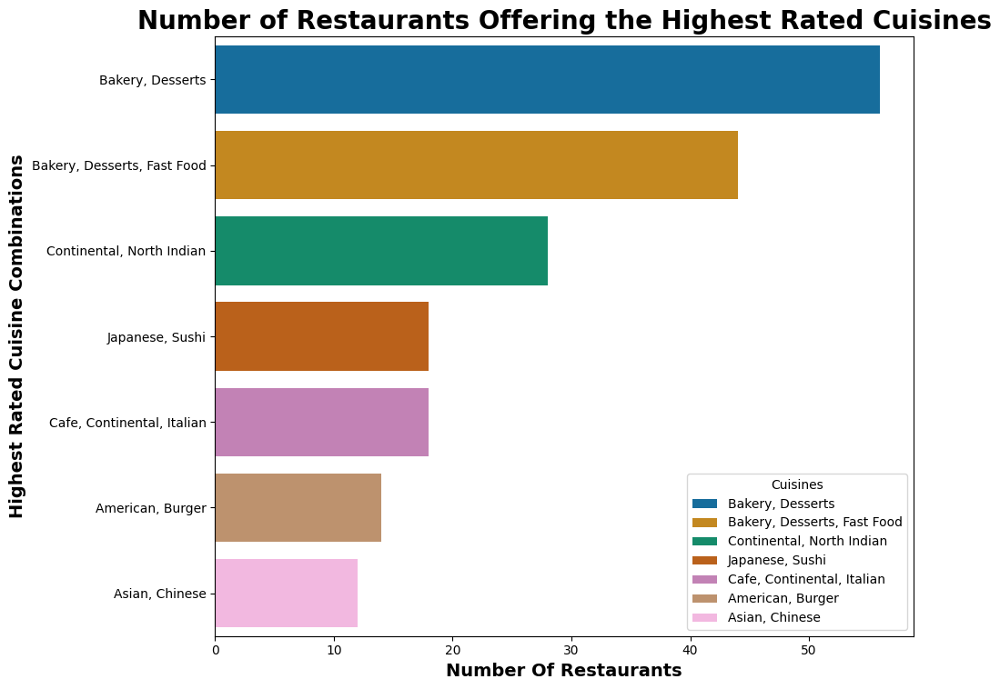

In [32]:
# Plot of Restaurants offering highest rated cuisines
plt.figure(figsize=(10.24,7.68))
sns.barplot(data=df_temp.sort_values(by='Restaurant_Count',ascending=False),x='Restaurant_Count',y='Cuisines',hue='Cuisines',palette='colorblind',legend='brief')
plt.xlabel('Number Of Restaurants',fontdict={'fontsize':14,'fontweight':'bold'})
plt.ylabel('Highest Rated Cuisine Combinations',fontdict={'fontsize':14,'fontweight':'bold'})
plt.title('Number of Restaurants Offering the Highest Rated Cuisines',fontdict={'fontsize':20,'fontweight':'bold'})
plt.tight_layout()
plt.show()

## Level 2 - Task 3

Task: Geographic Analysis
* Plot the locations of restaurants on a map using longitude and latitude coordinates.
* Identify any patterns or clusters of restaurants in specific areas

### Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [33]:
df_map = df[(df['Longitude']!=0)&(df['Latitude']!=0)]

m = folium.Map(location=[20, 0], zoom_start=2)

marker_cluster = MarkerCluster().add_to(m)

for _, row in df_map.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=row["Restaurant_Name"]
    ).add_to(marker_cluster)

m.save("map_clusters.html")
m

### Identify any patterns or clusters of restaurants in specific areas

In [34]:
m = folium.Map(location=[20, 0], zoom_start=2)

HeatMap(df_map[["Latitude", "Longitude"]]).add_to(m)

m.save("map_heat.html")
m

Most of the datapoints in the dataset seem to be belonging to restaurants based in India. There is a huge concentration of restaurants in the datasets in and around New Delhi. The second country with highest number of datapoints is the East Coast, specifically the East Coast.

## Level 2 - Task 4

Task: Restaurant Chains
* Identify if there are any restaurant chains present in the dataset.
* Analyze the ratings and popularity of different restaurant chains.

### Identify if there are any restaurant chains present in the dataset.

In [35]:
# Grouping by Restaurant name to identify chains
df_restaurant_chains = df.groupby('Restaurant_Name')['Restaurant_ID'].count().reset_index()
# Renaming columns
df_restaurant_chains.columns = ['Restaurant_Name','Restaurant_Count']

# Identifying chains
df_restaurant_chains = df_restaurant_chains[df_restaurant_chains['Restaurant_Count']>1]

# Grouping by restaurant name and aggregating necessary numerical columns
df_chains = df[(df['Rating_Text']!='Not rated')&(df['Aggregate_Rating']>0)&(df['Votes']>30)].groupby('Restaurant_Name').agg({'Restaurant_Name':'count','Aggregate_Rating':['min','max','mean'],'Votes':'sum','WR_Numerator':'sum'}).reset_index()
# Renaming columns
df_chains.columns = ['Restaurant_Name','Restaurant_Count','Min_Rating','Max_Rating','Avg_Rating','Total_Votes','WR_Numerator']
# Sorting by number of restaurants
df_chains = df_chains.sort_values(by='Restaurant_Count',ascending=False)
# Excluding restaurants that are not chains
df_chains = df_chains[df_chains['Restaurant_Count']>1]
# Creating the weighted rating column
df_chains['Weighted_Rating'] = round(df_chains['WR_Numerator']/df_chains['Total_Votes'],1)
# Defining the average of rating of whole dataset
c=round(df_chains['WR_Numerator'].sum()/df_chains['Total_Votes'].sum(),1)
m=5000 # Threshold for number of votes required as it is median value
# Defining function for bayesian weighted rating calculation
def wr(row):
    wr=((row['Total_Votes']/(row['Total_Votes']+m))*row['Weighted_Rating'])+((m/(row['Total_Votes']+m))*c)
    return wr

# Creating new column and applying function
df_chains['Bayesian_Weighted_Rating'] = df_chains.apply(wr,axis=1)
# Rounding to one digit after decimal
df_chains['Bayesian_Weighted_Rating'] = df_chains['Bayesian_Weighted_Rating'].apply(lambda x:round(x,1))
# Sorting by bayesian weighted rating
df_chains=df_chains.sort_values(by='Bayesian_Weighted_Rating',ascending=False)
# Top chains
df_chains_top = df_chains[df_chains['Bayesian_Weighted_Rating']>=4.0]
# Bottom chains
df_chains_bottom = df_chains[df_chains['Bayesian_Weighted_Rating']<=3.4]
# Average chains
df_chains_average = df_chains[(df_chains['Bayesian_Weighted_Rating']>3.4)&(df_chains['Bayesian_Weighted_Rating']<=3.9)]

In [36]:
print(f"There are {df_restaurant_chains.shape[0]} Restaurant Chains in the dataset.")

There are 734 Restaurant Chains in the dataset.


There are ***734 Restaurant Chains*** in the dataset

### Analyze the ratings and popularity of different restaurant chains.

In [37]:
print(f"There are {df_chains_top.shape[0]} Top Rated Restaurant Chains.")
print(f"There is {df_chains_bottom.shape[0]} Bad Rated Restaurant Chain.")
print(f"There are {df_chains_average.shape[0]} Average Rated Restaurant Chains.")

There are 41 Top Rated Restaurant Chains.
There is 1 Bad Rated Restaurant Chain.
There are 325 Average Rated Restaurant Chains.


* There are **41** ***Top Rated*** Restaurant Chains.
* There is **1** ***Bad Rated*** Restaurant Chain.
* There are **325** ***Average Rated*** Restaurant Chains.

In [38]:
# Analysing average chains
average_chains=df_chains_average[df_chains_average['Restaurant_Count']>5].sort_values(by='Restaurant_Count',ascending=False)['Restaurant_Name'].tolist()
print("Big popular Chains such as the ones mentioned below seem to have average ratings.\n")
step=1
for i in average_chains:
  print(f"{step}. {i}:\n    - Average Weighted Rating: {float(df_chains_average[df_chains_average['Restaurant_Name']==i]['Bayesian_Weighted_Rating'])}\n    - Total Votes: {int(df_chains_average[df_chains_average['Restaurant_Name']==i]['Total_Votes'])}\n")
  step += 1

Big popular Chains such as the ones mentioned below seem to have average ratings.

1. Subway:
    - Average Weighted Rating: 3.5
    - Total Votes: 5972

2. McDonald's:
    - Average Weighted Rating: 3.7
    - Total Votes: 5212

3. Cafe Coffee Day:
    - Average Weighted Rating: 3.7
    - Total Votes: 1789

4. Pizza Hut:
    - Average Weighted Rating: 3.7
    - Total Votes: 4954

5. Sagar Ratna:
    - Average Weighted Rating: 3.6
    - Total Votes: 4038

6. Dunkin' Donuts:
    - Average Weighted Rating: 3.8
    - Total Votes: 5945

7. Pizza Hut Delivery:
    - Average Weighted Rating: 3.7
    - Total Votes: 1472

8. Haldiram's:
    - Average Weighted Rating: 3.8
    - Total Votes: 4525

9. KFC:
    - Average Weighted Rating: 3.6
    - Total Votes: 2297

10. Chaayos:
    - Average Weighted Rating: 3.9
    - Total Votes: 2448

11. Shree Rathnam:
    - Average Weighted Rating: 3.8
    - Total Votes: 1051

12. Bikanervala:
    - Average Weighted Rating: 3.8
    - Total Votes: 2977

13. Bur

<u>Big popular Chains such as the ones mentioned below seem to have average ratings.</u>

| Restaurant Name   | Average Weighted Rating   | Total Votes   |
|-------------------|---------------------------|---------------|
| Subway | 3.5 | 5972 |
| McDonald's | 3.7 | 5212 |
| Cafe Coffee Day | 3.7 | 1789 |
| Pizza Hut | 3.7 | 4954 |
| Sagar Ratna | 3.6 | 4038 |
| Dunkin' Donuts | 3.8 | 5945 |
| Pizza Hut Delivery | 3.7 | 1472 |
| Haldiram's | 3.8 | 4525 |
| KFC | 3.6 | 2297 |
| Chaayos | 3.9 | 2448 |
| Shree Rathnam | 3.8 | 1051 |
| Bikanervala | 3.8 | 2977 |
| Burger King | 3.8 | 4580 |
| Karim's | 3.8 | 6877 |
| Pind Balluchi | 3.5 | 5496 |
| Giani | 3.8 | 701 |
| Costa Coffee | 3.8 | 847 |
| Giani's | 3.8 | 1027 |
| Wah Ji Wah | 3.7 | 956 |
| Green Chick Chop | 3.9 | 471 |
| Barista | 3.8 | 611 |
| Moti Mahal Delux | 3.8 | 934 |
| Yo! China | 3.7 | 1951 |
| Keventers | 3.9 | 1001 |
| Behrouz Biryani | 3.9 | 440 |
| Wow! Momo | 3.8 | 1102 |
| Slice of Italy | 3.7 | 1377 |
| Baskin Robbins | 3.9 | 297 |
| Angels in my Kitchen | 3.8 | 1219 |
| The Yellow Chilli | 3.9 | 1526 |
| TGI Friday's | 3.9 | 4357 |
| Kebab Xpress | 3.8 | 687 |
| Berco's | 3.8 | 5378 |
| Mainland China | 3.8 | 2541 |
| Cocoberry | 3.9 | 495 |
| Southy | 3.8 | 643 |
| 34, Chowringhee Lane | 3.8 | 709 |
| Chicago Pizza | 3.8 | 558 |

In [39]:
# Analyzing bottom chains
bottom_list=df_chains_bottom['Restaurant_Name'].tolist()
for i in bottom_list:
  print( f"{i} has the\n    - Lowest Average Rating: {float(df_chains_bottom['Bayesian_Weighted_Rating'])}\n    - Total Votes: {int(df_chains_bottom['Total_Votes'])}")

Domino's Pizza has the
    - Lowest Average Rating: 3.4
    - Total Votes: 6382


**Domino's Pizza** has the
* <u>Lowest Average Rating</u>: 3.4
* <u>Total Votes</u>: 6382

In [40]:
# Analyzing top chains
top_list=df_chains_top.sort_values(by='Restaurant_Count',ascending=False)['Restaurant_Name'].tolist()
step1=1
print("Top Rated Restaurants have the following features:\n")
for i in top_list:
  print(f"  {step1}. {i}\n    - No. of Outlets: {int(df_chains_top[df_chains_top['Restaurant_Name']==i]['Restaurant_Count'])}\n    - Average Rating: {float(df_chains_top[df_chains_top['Restaurant_Name']==i]['Bayesian_Weighted_Rating'])}\n    - Total Votes: {int(df_chains_top[df_chains_top['Restaurant_Name']==i]['Total_Votes'])}\n")
  step1 +=1

Top Rated Restaurants have the following features:

  1. Barbeque Nation
    - No. of Outlets: 26
    - Average Rating: 4.4
    - Total Votes: 28142

  2. Starbucks
    - No. of Outlets: 17
    - Average Rating: 4.0
    - Total Votes: 7123

  3. Mocha
    - No. of Outlets: 7
    - Average Rating: 4.1
    - Total Votes: 3111

  4. Farzi Cafe
    - No. of Outlets: 6
    - Average Rating: 4.2
    - Total Votes: 10098

  5. Chili's
    - No. of Outlets: 5
    - Average Rating: 4.3
    - Total Votes: 8156

  6. Punjab Grill
    - No. of Outlets: 5
    - Average Rating: 4.1
    - Total Votes: 5424

  7. Pirates of Grill
    - No. of Outlets: 4
    - Average Rating: 4.0
    - Total Votes: 7091

  8. AB's - Absolute Barbecues
    - No. of Outlets: 4
    - Average Rating: 4.5
    - Total Votes: 13400

  9. Big Chill
    - No. of Outlets: 4
    - Average Rating: 4.3
    - Total Votes: 10853

  10. Gazebo
    - No. of Outlets: 3
    - Average Rating: 4.0
    - Total Votes: 1279

  11. SodaBottleO

<u>The Top Rated Restaurants have the following features</u>

| Restaurant_Name | No. of Outlets | Average Rating | Total Votes |
|-----------------|----------------|----------------|-------------|
| Barbeque Nation | 26 | 4.4 | 28142 |
| Starbucks | 17 | 4.0 | 7123 |
| Mocha | 7 | 4.1 | 3111 |
| Farzi Cafe | 6 | 4.2 | 10098 |
| Chili's | 5 | 4.3 | 8156 |
| Punjab Grill | 5 | 4.1 | 5424 |
| Pirates of Grill | 4 | 4.0 | 7091 |
| AB's - Absolute Barbecues | 4 | 4.5 | 13400 |
| Big Chill | 4 | 4.3 | 10853 |
| Gazebo | 3 | 4.0 | 1279 |
| SodaBottleOpenerWala | 3 | 4.0 | 5374 |
| Palmshore | 3 | 4.0 | 2228 |
| Talaga Sampireun | 3 | 4.4 | 5514 |
| Mamagoto | 3 | 4.0 | 2633 |
| Big Yellow Door | 3 | 4.1 | 7511 |
| Hard Rock Cafe | 3 | 4.1 | 3491 |
| Onesta | 3 | 4.1 | 2821 |
| Saravana Bhavan | 3 | 4.1 | 7238 |
| The Fisherman's Wharf | 3 | 4.0 | 1022 |
| Naturals Ice Cream | 2 | 4.3 | 3094 |
| AB's Absolute Barbecues | 2 | 4.2 | 3151 |
| The Cheesecake Factory | 2 | 4.2 | 3010 |
| Bombay Brasserie | 2 | 4.1 | 1984 |
| The Flying Saucer Cafe | 2 | 4.1 | 3145 |
| Joey's Pizza | 2 | 4.1 | 7807 |
| The Big Chill Cakery | 2 | 4.0 | 1059 |
| Matchbox | 2 | 4.0 | 1214 |
| Smoke House Deli | 2 | 4.0 | 2292 |
| Effingut Brewerkz | 2 | 4.0 | 1906 |
| Silantro Fil-Mex | 2 | 4.1 | 1364 |
| Dishoom | 2 | 4.1 | 1269 |
| Twigly | 2 | 4.0 | 471 |
| Ceviche Tapas Bar & Restaurant | 2 | 4.0 | 1993 |
| San Carlo | 2 | 4.0 | 893 |
| Caffe 9 | 2 | 4.0 | 1030 |
| Din Tai Fung | 2 | 4.0 | 997 |
| Natural Ice Cream | 2 | 4.0 | 732 |
| Oh! Calcutta | 2 | 4.0 | 1999 |
| SpiceKlub | 2 | 4.0 | 3651 |
| Whipped | 2 | 4.0 | 1497 |
| Olive Bistro | 2 | 4.0 | 3708 |

In [41]:
# Grouping data to identify international franchises
df_franchise=df[(df['Rating_Text']!='Not rated')&(df['Aggregate_Rating']>0)&(df['Votes']>30)].groupby('Restaurant_Name').agg({'Restaurant_Name':'count', 'City':'nunique','Country':'nunique','Votes':['sum','mean'],'WR_Numerator':'sum'}).reset_index()
# Renaming columns
df_franchise.columns = ['Restaurant_Name','Restaurant_Count','City_Spread','Country_Spread','Total_Votes','Avg_Votes','WR_Numerator']
# Franchises present in multiple cities
df_franchise_city=df_franchise[df_franchise['City_Spread']>1].sort_values(by='City_Spread',ascending=False).reset_index()
# Franchises present in several countries
df_franchise_world=df_franchise[df_franchise['Country_Spread']>1].sort_values(by='Country_Spread',ascending=False).reset_index()
# Calculating the weighted rating
df_franchise_world['Weighted_Rating']=round(df_franchise_world['WR_Numerator']/df_franchise_world['Total_Votes'],1)
# Selecting only relevant columns
df_franchise_world = df_franchise_world[['Restaurant_Name','Restaurant_Count','City_Spread','Country_Spread','Total_Votes','Weighted_Rating']].sort_values(by='Weighted_Rating',ascending=False)
# Displaying the worldwide franchises
df_franchise_world

,Restaurant_Name,Restaurant_Count,City_Spread,Country_Spread,Total_Votes,Weighted_Rating
7,Gymkhana,2,2,2,328,4.7
3,Barbeque Nation,26,22,2,28142,4.5
4,Din Tai Fung,2,2,2,997,4.3
0,Hard Rock Cafe,3,3,3,3491,4.3
5,Farzi Cafe,6,6,2,10098,4.3
13,Punjab Grill,5,4,2,5424,4.3
21,The Creamery,2,2,2,415,4.3
6,Gazebo,3,3,2,1279,4.2
15,SpiceKlub,2,2,2,3651,4.2
2,Chili's Grill & Bar,2,2,2,813,4.1


In [42]:
world_franchises=df_franchise_world['Restaurant_Name'].tolist()
print("* The following Chains are present in multiple cities across several countries:\n")
step2=1
for i in world_franchises:
  print(f"  {step2}. {i}")
  step2+=1

* The following Chains are present in multiple cities across several countries:

  1. Gymkhana
  2. Barbeque Nation
  3. Din Tai Fung
  4. Hard Rock Cafe
  5. Farzi Cafe
  6. Punjab Grill
  7. The Creamery
  8. Gazebo
  9. SpiceKlub
  10. Chili's Grill & Bar
  11. The Breakfast Club
  12. Ichiban
  13. Starbucks
  14. The National
  15. Jamie's Italian
  16. The Crab Shack
  17. Nando's
  18. Texas Roadhouse
  19. Applebee's
  20. TGI Friday's
  21. Tipu Sultan
  22. Punjab Restaurant
  23. Pizza Hut
  24. Indian Coffee House


<u>The following Chains are present in multiple cities across several countries:</u>

1. Gymkhana
1. Barbeque Nation
1. Din Tai Fung
1. Hard Rock Cafe
1. Farzi Cafe
1. Punjab Grill
1. The Creamery
1. Gazebo
1. SpiceKlub
1. Chili's Grill & Bar
1. The Breakfast Club
1. Ichiban
1. Starbucks
1. The National
1. Jamie's Italian
1. The Crab Shack
1. Nando's
1. Texas Roadhouse
1. Applebee's
1. TGI Friday's
1. Tipu Sultan
1. Punjab Restaurant
1. Pizza Hut
1. Indian Coffee House

#### Plot 1

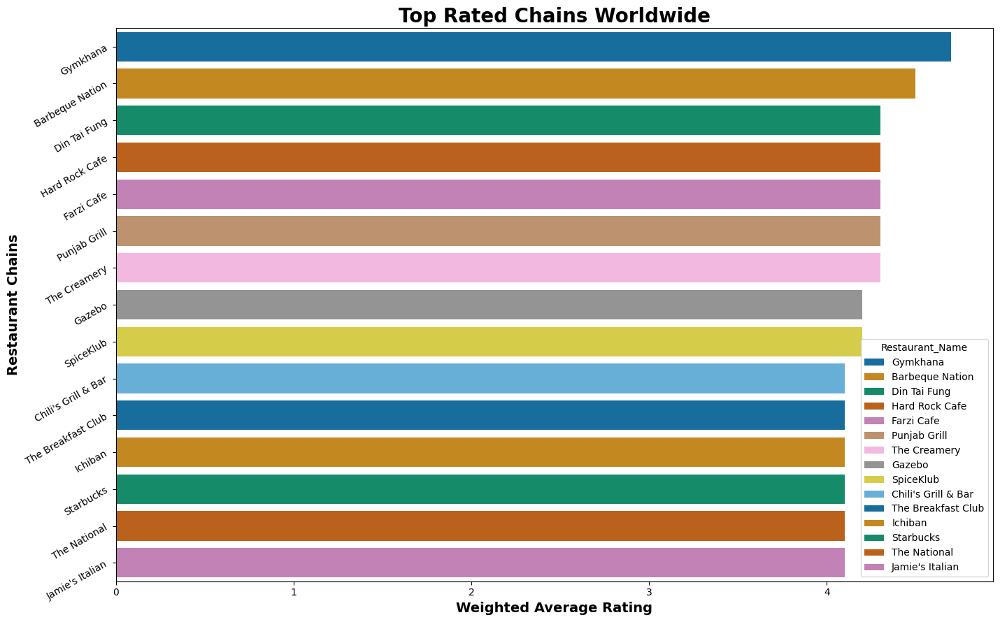

In [43]:
# Top worldwide franchises with rating above 4
plt.figure(figsize=(14.4,9))
sns.barplot(data=df_franchise_world[df_franchise_world['Weighted_Rating']>4.0],x='Weighted_Rating',y='Restaurant_Name',hue='Restaurant_Name',palette='colorblind',legend='brief')
plt.xlabel('Weighted Average Rating',fontdict={'fontsize':14,'fontweight':'semibold'})
plt.ylabel('Restaurant Chains',fontdict={'fontsize':14,'fontweight':'semibold'})
plt.title('Top Rated Chains Worldwide',fontdict={'fontsize':20,'fontweight':'heavy'})
plt.yticks(rotation=30)
plt.tight_layout()
plt.show()

#### Plot 2

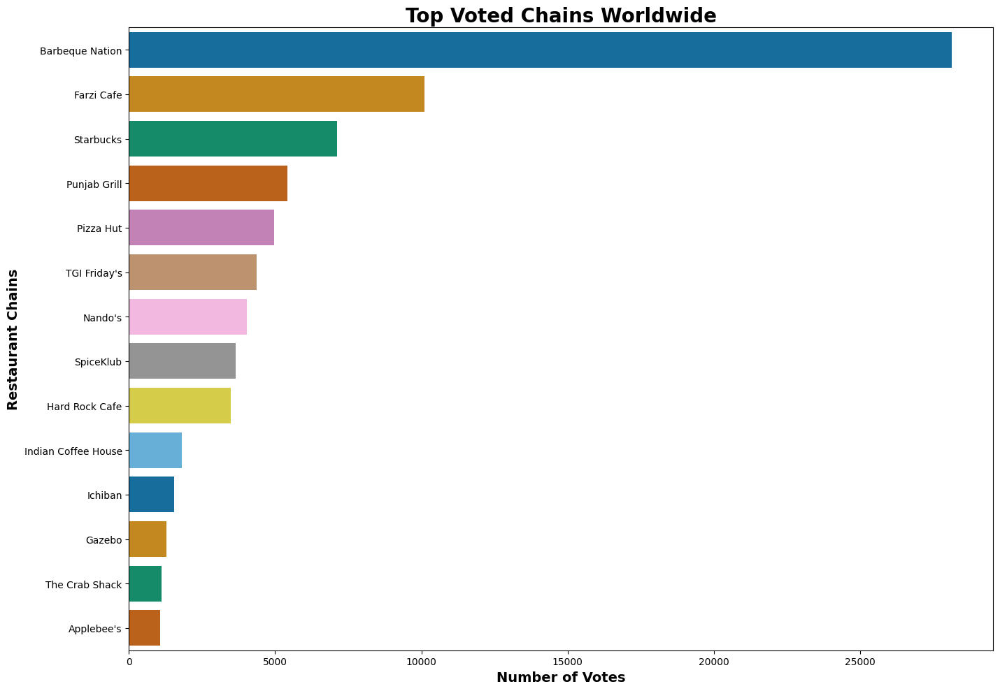

In [44]:
# Franchises by number of votes > 1000
plt.figure(figsize=(14.40,10))
sns.barplot(data=df_franchise_world[df_franchise_world['Total_Votes']>1000].sort_values(by='Total_Votes',ascending=False),x='Total_Votes',y='Restaurant_Name',hue='Restaurant_Name',palette='colorblind')
plt.xlabel('Number of Votes',fontdict={'fontsize':14,'fontweight':'semibold'})
plt.ylabel('Restaurant Chains',fontdict={'fontsize':14,'fontweight':'semibold'})
plt.title('Top Voted Chains Worldwide',fontdict={'fontsize':20,'fontweight':'heavy'})
plt.tight_layout()
plt.show()

**Barbeque Nation** is the *highest rated* and *highest voted* Restaurant Chain in the entire dataset.

# Insights Gained From the Analysis

* Most common rating range is between 4-4.5 followed by 3.5-4
* Average number of votes recieved by restaurants across the dataset is 202
* <u>Top 10 Most Common Cuisine combinations:</u>

  1. Chinese, North Indian
  2. Mughlai, North Indian
  3. Chinese, Mughlai, North Indian
  4. Fast Food, Pizza
  5. Burger, Fast Food
  6. Chinese, North Indian, South Indian
  7. Chinese, Continental, North Indian
  8. Bakery, Desserts
  9. American, Fast Food, Healthy Food, Salad
  10. Bakery, Fast Food

* <u>Top 10 Most Popular Cuisine combinations:</u>

  1. American, Fast Food, Healthy Food, Salad
  2. Fast Food, Pizza
  3. Burger, Desserts, Fast Food
  4. Burger, Fast Food
  5. Fast Food, Italian, Pizza
  6. Cafe, Tea
  7. Chinese, Desserts, Fast Food, Mithai, North Indian, South Indian, Street Food
  8. Fast Food, North Indian, Raw Meats
  9. Beverages, Chinese, Desserts, Fast Food, Mithai, North Indian, South Indian, Street Food
  10. Bakery, Italian, Pizza

* <u>The following cuisine combinations have a higher rating</u>

  1. Japanese, Sushi
  2. American, Burger
  3. Cafe, Continental, Italian
  4. Continental, North Indian
  5. Bakery, Dessers
  6. Asian, Chinese
  7. Bakery, Desserts, Fast Food

* Most of the datapoints in the dataset seem to be belonging to restaurants based in India. There is a huge concentration of restaurants in the datasets in and around New Delhi and other urban areas in general. The second country with highest number of datapoints is the East Coast, specifically the East Coast.

* There are 734 Restaurant Chains in the dataset

* There are 41 Top Rated Restaurant Chains.
* There is 1 Bad Rated Restaurant Chain.
* There are 325 Average Rated Restaurant Chains.

* Big popular Chains such as the ones mentioned below seem to have average ratings.

  1. Subway:
      - Average Weighted Rating: 3.5
      - Total Votes: 5972

  2. McDonald's:
      - Average Weighted Rating: 3.7
      - Total Votes: 5212

  3. Cafe Coffee Day:
      - Average Weighted Rating: 3.7
      - Total Votes: 1789

  4. Pizza Hut:
      - Average Weighted Rating: 3.7
      - Total Votes: 4954

  5. Sagar Ratna:
      - Average Weighted Rating: 3.6
      - Total Votes: 4038

  6. Dunkin' Donuts:
      - Average Weighted Rating: 3.8
      - Total Votes: 5945

  7. Pizza Hut Delivery:
      - Average Weighted Rating: 3.7
      - Total Votes: 1472

  8. Haldiram's:
      - Average Weighted Rating: 3.8
      - Total Votes: 4525

  9. KFC:
      - Average Weighted Rating: 3.6
      - Total Votes: 2297

  10. Chaayos:
      - Average Weighted Rating: 3.9
      - Total Votes: 2448

  11. Shree Rathnam:
      - Average Weighted Rating: 3.8
      - Total Votes: 1051

  12. Bikanervala:
      - Average Weighted Rating: 3.8
      - Total Votes: 2977

  13. Burger King:
      - Average Weighted Rating: 3.8
      - Total Votes: 4580

  14. Karim's:
      - Average Weighted Rating: 3.8
      - Total Votes: 6877

  15. Pind Balluchi:
      - Average Weighted Rating: 3.5
      - Total Votes: 5496

  16. Giani:
      - Average Weighted Rating: 3.8
      - Total Votes: 701

  17. Costa Coffee:
      - Average Weighted Rating: 3.8
      - Total Votes: 847

  18. Giani's:
      - Average Weighted Rating: 3.8
      - Total Votes: 1027

  19. Wah Ji Wah:
      - Average Weighted Rating: 3.7
      - Total Votes: 956

  20. Green Chick Chop:
      - Average Weighted Rating: 3.9
      - Total Votes: 471

  21. Barista:
      - Average Weighted Rating: 3.8
      - Total Votes: 611

  22. Moti Mahal Delux:
      - Average Weighted Rating: 3.8
      - Total Votes: 934

  23. Yo! China:
      - Average Weighted Rating: 3.7
      - Total Votes: 1951

  24. Keventers:
      - Average Weighted Rating: 3.9
      - Total Votes: 1001

  25. Behrouz Biryani:
      - Average Weighted Rating: 3.9
      - Total Votes: 440

  26. Wow! Momo:
      - Average Weighted Rating: 3.8
      - Total Votes: 1102

  27. Slice of Italy:
      - Average Weighted Rating: 3.7
      - Total Votes: 1377

  28. Baskin Robbins:
      - Average Weighted Rating: 3.9
      - Total Votes: 297

  29. Angels in my Kitchen:
      - Average Weighted Rating: 3.8
      - Total Votes: 1219

  30. The Yellow Chilli:
      - Average Weighted Rating: 3.9
      - Total Votes: 1526

  31. TGI Friday's:
      - Average Weighted Rating: 3.9
      - Total Votes: 4357

  32. Kebab Xpress:
      - Average Weighted Rating: 3.8
      - Total Votes: 687

  33. Berco's:
      - Average Weighted Rating: 3.8
      - Total Votes: 5378

  34. Mainland China:
      - Average Weighted Rating: 3.8
      - Total Votes: 2541

  35. Cocoberry:
      - Average Weighted Rating: 3.9
      - Total Votes: 495

  36. Southy:
      - Average Weighted Rating: 3.8
      - Total Votes: 643

  37. 34, Chowringhee Lane:
      - Average Weighted Rating: 3.8
      - Total Votes: 709

  38. Chicago Pizza:
      - Average Weighted Rating: 3.8
      - Total Votes: 558

* Domino's Pizza has the
    - Lowest Average Rating: 3.4
    - Total Votes: 6382

* Top Rated Restaurants have the following features:

  1. Barbeque Nation
    - No. of Outlets: 26
    - Average Rating: 4.4
    - Total Votes: 28142

  2. Starbucks
    - No. of Outlets: 17
    - Average Rating: 4.0
    - Total Votes: 7123

  3. Mocha
    - No. of Outlets: 7
    - Average Rating: 4.1
    - Total Votes: 3111

  4. Farzi Cafe
    - No. of Outlets: 6
    - Average Rating: 4.2
    - Total Votes: 10098

  5. Chili's
    - No. of Outlets: 5
    - Average Rating: 4.3
    - Total Votes: 8156

  6. Punjab Grill
    - No. of Outlets: 5
    - Average Rating: 4.1
    - Total Votes: 5424

  7. Pirates of Grill
    - No. of Outlets: 4
    - Average Rating: 4.0
    - Total Votes: 7091

  8. AB's - Absolute Barbecues
    - No. of Outlets: 4
    - Average Rating: 4.5
    - Total Votes: 13400

  9. Big Chill
    - No. of Outlets: 4
    - Average Rating: 4.3
    - Total Votes: 10853

  10. Gazebo
    - No. of Outlets: 3
    - Average Rating: 4.0
    - Total Votes: 1279

  11. SodaBottleOpenerWala
    - No. of Outlets: 3
    - Average Rating: 4.0
    - Total Votes: 5374

  12. Palmshore
    - No. of Outlets: 3
    - Average Rating: 4.0
    - Total Votes: 2228

  13. Talaga Sampireun
    - No. of Outlets: 3
    - Average Rating: 4.4
    - Total Votes: 5514

  14. Mamagoto
    - No. of Outlets: 3
    - Average Rating: 4.0
    - Total Votes: 2633

  15. Big Yellow Door
    - No. of Outlets: 3
    - Average Rating: 4.1
    - Total Votes: 7511

  16. Hard Rock Cafe
    - No. of Outlets: 3
    - Average Rating: 4.1
    - Total Votes: 3491

  17. Onesta
    - No. of Outlets: 3
    - Average Rating: 4.1
    - Total Votes: 2821

  18. Saravana Bhavan
    - No. of Outlets: 3
    - Average Rating: 4.1
    - Total Votes: 7238

  19. The Fisherman's Wharf
    - No. of Outlets: 3
    - Average Rating: 4.0
    - Total Votes: 1022

  20. Naturals Ice Cream
    - No. of Outlets: 2
    - Average Rating: 4.3
    - Total Votes: 3094

  21. AB's Absolute Barbecues
    - No. of Outlets: 2
    - Average Rating: 4.2
    - Total Votes: 3151

  22. The Cheesecake Factory
    - No. of Outlets: 2
    - Average Rating: 4.2
    - Total Votes: 3010

  23. Bombay Brasserie
    - No. of Outlets: 2
    - Average Rating: 4.1
    - Total Votes: 1984

  24. The Flying Saucer Cafe
    - No. of Outlets: 2
    - Average Rating: 4.1
    - Total Votes: 3145

  25. Joey's Pizza
    - No. of Outlets: 2
    - Average Rating: 4.1
    - Total Votes: 7807

  26. The Big Chill Cakery
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 1059

  27. Matchbox
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 1214

  28. Smoke House Deli
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 2292

  29. Effingut Brewerkz
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 1906

  30. Silantro Fil-Mex
    - No. of Outlets: 2
    - Average Rating: 4.1
    - Total Votes: 1364

  31. Dishoom
    - No. of Outlets: 2
    - Average Rating: 4.1
    - Total Votes: 1269

  32. Twigly
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 471

  33. Ceviche Tapas Bar & Restaurant
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 1993

  34. San Carlo
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 893

  35. Caffe 9
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 1030

  36. Din Tai Fung
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 997

  37. Natural Ice Cream
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 732

  38. Oh! Calcutta
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 1999

  39. SpiceKlub
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 3651

  40. Whipped
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 1497

  41. Olive Bistro
    - No. of Outlets: 2
    - Average Rating: 4.0
    - Total Votes: 3708

* The following Chains are present in multiple cities across several countries:

  1. Gymkhana
  2. Barbeque Nation
  3. Din Tai Fung
  4. Hard Rock Cafe
  5. Farzi Cafe
  6. Punjab Grill
  7. The Creamery
  8. Gazebo
  9. SpiceKlub
  10. Chili's Grill & Bar
  11. The Breakfast Club
  12. Ichiban
  13. Starbucks
  14. The National
  15. Jamie's Italian
  16. The Crab Shack
  17. Nando's
  18. Texas Roadhouse
  19. Applebee's
  20. TGI Friday's
  21. Tipu Sultan
  22. Punjab Restaurant
  23. Pizza Hut
  24. Indian Coffee House

* Barbeque Nation is the highest rated and highest voted Restaurant Chain in the entire dataset.

# Business Intelligence Decisions Based on the Insights

## Ratings & Votes


- Most restaurants cluster in the **3.5–4.5 rating range**, with an average of ~202 votes.  
- **Decision:** Restaurants with <3.5 ratings should prioritize quality improvements before expansion.  
- **Decision:** Establish a minimum votes threshold (e.g., 200+) when comparing performance, ensuring ratings reflect real customer engagement.

## Cuisine Combinations

- Common combos (North Indian + Chinese, Mughlai + North Indian, Fast Food + Pizza) dominate supply, while popular combos skew toward **fast food + healthy/American mixes**.  
- **Decision:** Add Indo-Chinese and Mughlai-North Indian items to diversify menus.  
- **Decision:** Food delivery platforms should highlight **“Healthy Fast Food” combos** to match customer demand.

## High-Rated Cuisine Combinations

- Sushi, Japanese, American Burgers, and Continental-Italian combos consistently score ≥4.  
- **Decision:** Position these cuisines as **premium experiences** with higher price points and upscale packaging.  
- **Decision:** Identify cities lacking these combos for targeted expansion.

## Geographic Concentration


- Dataset heavily skewed toward India (especially New Delhi and metros); East Coast US is second.  
- **Decision:** In India, focus on **differentiation** (unique cuisines, experience-based dining).  
- **Decision:** In the US, explore **suburban expansion**, where delivery penetration is still rising.

## Chain Performance

- 734 chains: majority are average-rated (3.5–3.7). Big brands like McDonald’s, Subway, and KFC show average performance despite reach.  
- **Decision:** QSR giants should push **experience upgrades** (healthy menus, better service) to break out of “average”.  
- **Decision:** Create dashboards that track **rating vs. votes** to flag chains with high exposure but poor ratings.

## Top vs. Weak Chains

- Domino’s: very high votes but low average rating (3.4).  
- Barbeque Nation and AB’s Absolute Barbecues: industry leaders with 4.4–4.5 ratings and very high votes.  
- **Decision:** Domino’s must innovate in menu and service to address retention risks.  
- **Decision:** Top-performing chains should double down on loyalty programs and expand into new geographies.

## Multi-Country Chains

- Global brands (Hard Rock, Chili’s, Nando’s, Starbucks, Applebee’s) appear in multiple geographies.  
- **Decision:** Benchmark ratings across countries to assess consistency.  
- **Decision:** Adapt menus to local tastes where performance lags.

# Summary


- Expansion → Concentrate on India (especially Delhi NCR), while testing suburban growth in the US East Coast.  
- Cuisine Mix → Strengthen menus with North Indian, Chinese, Mughlai, Fast Food; explore premium niches like Sushi, Continental, Burgers.  
- Pricing → Keep offerings affordable (Price Ranges 1 & 2 dominate the dataset).  
- Delivery → Huge demand driver, but ratings show quality gaps — invest in packaging, timeliness, and consistency.  
- Chains → Average-rated QSR giants must innovate; premium chains (Barbeque Nation, AB’s) should scale aggressively.  
- Strategy → Balance mass-market volume with curated premium experiences to capture both affordability-driven and quality-driven segments.  